# Team Aluminum 

importing revelant libraries 

In [1]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm
from statsmodels.formula.api import ols
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from utils import evaluate

import warnings
warnings.filterwarnings("ignore")


## Load Housing Data, explore data, missing values

In [2]:
data = pd.read_csv('../../data/kc_house_data.csv')
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   date           21597 non-null  object 
 2   price          21597 non-null  float64
 3   bedrooms       21597 non-null  int64  
 4   bathrooms      21597 non-null  float64
 5   sqft_living    21597 non-null  int64  
 6   sqft_lot       21597 non-null  int64  
 7   floors         21597 non-null  float64
 8   waterfront     19221 non-null  object 
 9   view           21534 non-null  object 
 10  condition      21597 non-null  object 
 11  grade          21597 non-null  object 
 12  sqft_above     21597 non-null  int64  
 13  sqft_basement  21597 non-null  object 
 14  yr_built       21597 non-null  int64  
 15  yr_renovated   17755 non-null  float64
 16  zipcode        21597 non-null  int64  
 17  lat            21597 non-null  float64
 18  long  

In [3]:
data.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,sqft_above,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.159700e+04,2.159700e+04,21597.000000,21597.000000,21597.000000,2.159700e+04,21597.000000,21597.000000,21597.000000,17755.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000
mean,4.580474e+09,5.402966e+05,3.373200,2.115826,2080.321850,1.509941e+04,1.494096,1788.596842,1970.999676,83.636778,98077.951845,47.560093,-122.213982,1986.620318,12758.283512
std,2.876736e+09,3.673681e+05,0.926299,0.768984,918.106125,4.141264e+04,0.539683,827.759761,29.375234,399.946414,53.513072,0.138552,0.140724,685.230472,27274.441950
min,1.000102e+06,7.800000e+04,1.000000,0.500000,370.000000,5.200000e+02,1.000000,370.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,2.123049e+09,3.220000e+05,3.000000,1.750000,1430.000000,5.040000e+03,1.000000,1190.000000,1951.000000,0.000000,98033.000000,47.471100,-122.328000,1490.000000,5100.000000
50%,3.904930e+09,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,1560.000000,1975.000000,0.000000,98065.000000,47.571800,-122.231000,1840.000000,7620.000000
75%,7.308900e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.068500e+04,2.000000,2210.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,9410.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


In [4]:
data.isna().sum()

id                  0
date                0
price               0
bedrooms            0
bathrooms           0
sqft_living         0
sqft_lot            0
floors              0
waterfront       2376
view               63
condition           0
grade               0
sqft_above          0
sqft_basement       0
yr_built            0
yr_renovated     3842
zipcode             0
lat                 0
long                0
sqft_living15       0
sqft_lot15          0
dtype: int64

In [5]:
data.mean()

id               4.580474e+09
price            5.402966e+05
bedrooms         3.373200e+00
bathrooms        2.115826e+00
sqft_living      2.080322e+03
sqft_lot         1.509941e+04
floors           1.494096e+00
sqft_above       1.788597e+03
yr_built         1.971000e+03
yr_renovated     8.363678e+01
zipcode          9.807795e+04
lat              4.756009e+01
long            -1.222140e+02
sqft_living15    1.986620e+03
sqft_lot15       1.275828e+04
dtype: float64

In [6]:
data = data.drop(columns='id', axis=1)
data

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,NONE,Average,7 Average,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650
1,12/9/2014,538000.0,3,2.25,2570,7242,2.0,NO,NONE,Average,7 Average,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639
2,2/25/2015,180000.0,2,1.00,770,10000,1.0,NO,NONE,Average,6 Low Average,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062
3,12/9/2014,604000.0,4,3.00,1960,5000,1.0,NO,NONE,Very Good,7 Average,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000
4,2/18/2015,510000.0,3,2.00,1680,8080,1.0,NO,NONE,Average,8 Good,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21592,5/21/2014,360000.0,3,2.50,1530,1131,3.0,NO,NONE,Average,8 Good,1530,0.0,2009,0.0,98103,47.6993,-122.346,1530,1509
21593,2/23/2015,400000.0,4,2.50,2310,5813,2.0,NO,NONE,Average,8 Good,2310,0.0,2014,0.0,98146,47.5107,-122.362,1830,7200
21594,6/23/2014,402101.0,2,0.75,1020,1350,2.0,NO,NONE,Average,7 Average,1020,0.0,2009,0.0,98144,47.5944,-122.299,1020,2007
21595,1/16/2015,400000.0,3,2.50,1600,2388,2.0,NaN,NONE,Average,8 Good,1600,0.0,2004,0.0,98027,47.5345,-122.069,1410,1287


<AxesSubplot:xlabel='price'>

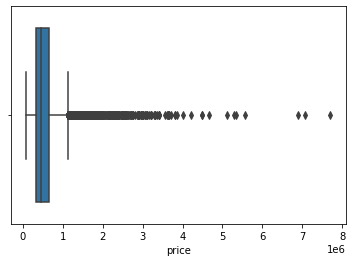

In [7]:
sns.boxplot(data["price"])

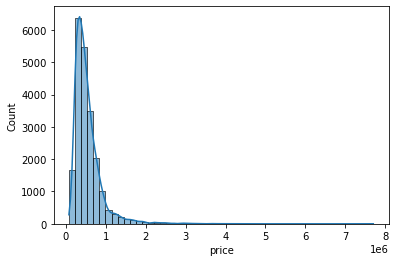

In [8]:
sns.histplot(data['price'],kde=True,bins=50);


array([[<AxesSubplot:title={'center':'price'}>,
        <AxesSubplot:title={'center':'bedrooms'}>,
        <AxesSubplot:title={'center':'bathrooms'}>,
        <AxesSubplot:title={'center':'sqft_living'}>],
       [<AxesSubplot:title={'center':'sqft_lot'}>,
        <AxesSubplot:title={'center':'floors'}>,
        <AxesSubplot:title={'center':'sqft_above'}>,
        <AxesSubplot:title={'center':'yr_built'}>],
       [<AxesSubplot:title={'center':'yr_renovated'}>,
        <AxesSubplot:title={'center':'zipcode'}>,
        <AxesSubplot:title={'center':'lat'}>,
        <AxesSubplot:title={'center':'long'}>],
       [<AxesSubplot:title={'center':'sqft_living15'}>,
        <AxesSubplot:title={'center':'sqft_lot15'}>, <AxesSubplot:>,
        <AxesSubplot:>]], dtype=object)

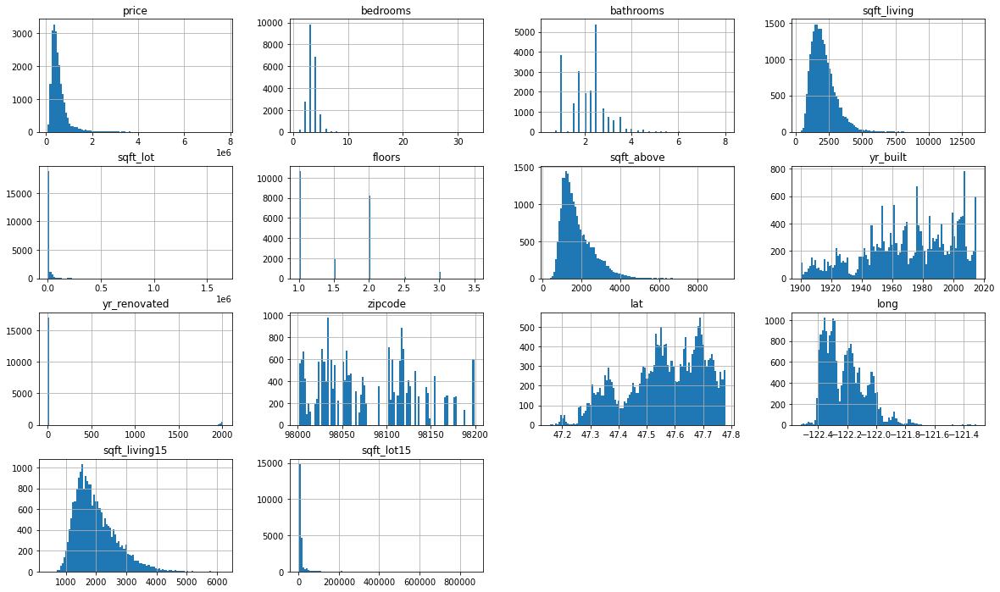

In [9]:
data.hist(bins=100, figsize=(20, 12))

- Look at = sqft_living15, sqft_above, sqft_living, price ofc ..... Maybe see long location = more $$ ?
- Also look at bedroom, 1 random 30...

### Correlations

<AxesSubplot:>

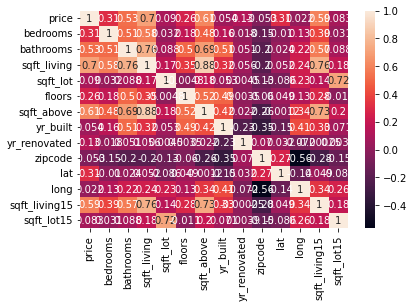

In [10]:
corr = data.corr()
sns.heatmap(corr, annot=True)

In [11]:
data.corr()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,sqft_above,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
price,1.000000,0.308787,0.525906,0.701917,0.089876,0.256804,0.605368,0.053953,0.129599,-0.053402,0.306692,0.022036,0.585241,0.082845
bedrooms,0.308787,1.000000,0.514508,0.578212,0.032471,0.177944,0.479386,0.155670,0.018495,-0.154092,-0.009951,0.132054,0.393406,0.030690
bathrooms,0.525906,0.514508,1.000000,0.755758,0.088373,0.502582,0.686668,0.507173,0.051050,-0.204786,0.024280,0.224903,0.569884,0.088303
sqft_living,0.701917,0.578212,0.755758,1.000000,0.173453,0.353953,0.876448,0.318152,0.055660,-0.199802,0.052155,0.241214,0.756402,0.184342
sqft_lot,0.089876,0.032471,0.088373,0.173453,1.000000,-0.004814,0.184139,0.052946,0.004513,-0.129586,-0.085514,0.230227,0.144763,0.718204
floors,0.256804,0.177944,0.502582,0.353953,-0.004814,1.000000,0.523989,0.489193,0.003535,-0.059541,0.049239,0.125943,0.280102,-0.010722
sqft_above,0.605368,0.479386,0.686668,0.876448,0.184139,0.523989,1.000000,0.424037,0.022137,-0.261570,-0.001199,0.344842,0.731767,0.195077
yr_built,0.053953,0.155670,0.507173,0.318152,0.052946,0.489193,0.424037,1.000000,-0.225209,-0.347210,-0.148370,0.409993,0.326377,0.070777
yr_renovated,0.129599,0.018495,0.051050,0.055660,0.004513,0.003535,0.022137,-0.225209,1.000000,0.069846,0.032145,-0.072156,-0.000247,0.003852
zipcode,-0.053402,-0.154092,-0.204786,-0.199802,-0.129586,-0.059541,-0.261570,-0.347210,0.069846,1.000000,0.266742,-0.564259,-0.279299,-0.147294


<AxesSubplot:>

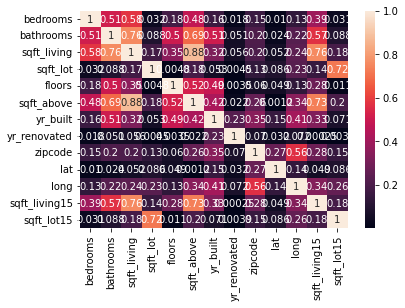

In [12]:
depend = data.drop(columns = "price", axis = 1)
depend_corr = depend.corr()
sns.heatmap(depend_corr.abs(), annot =True)

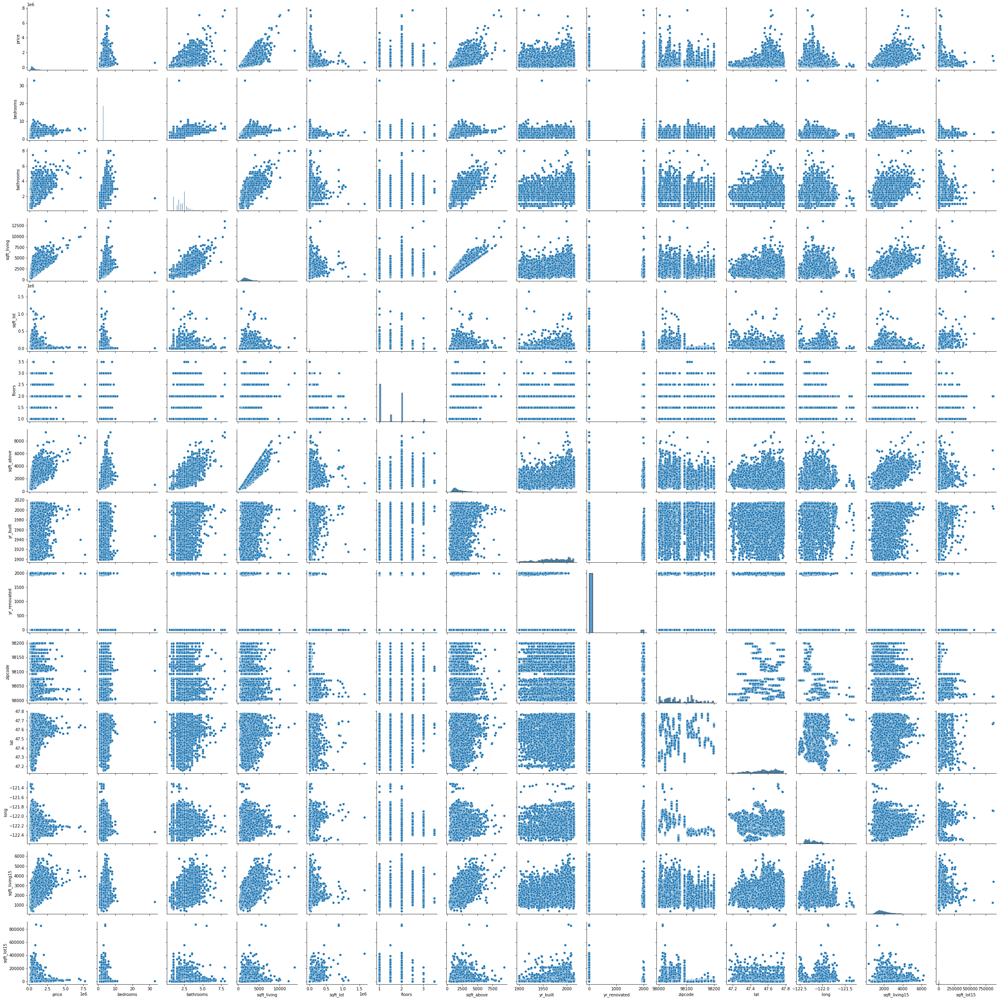

In [13]:
#data = pd.read_csv('data/kc_house_data.csv')
#data.head()
sns.pairplot(data)
plt.show()


### Investigating Square foot measures

In [14]:
data['sqft_living'].describe()

count    21597.000000
mean      2080.321850
std        918.106125
min        370.000000
25%       1430.000000
50%       1910.000000
75%       2550.000000
max      13540.000000
Name: sqft_living, dtype: float64

In [15]:
data['sqft_lot'].describe()

count    2.159700e+04
mean     1.509941e+04
std      4.141264e+04
min      5.200000e+02
25%      5.040000e+03
50%      7.618000e+03
75%      1.068500e+04
max      1.651359e+06
Name: sqft_lot, dtype: float64

In [16]:
data['sqft_above'].describe()

count    21597.000000
mean      1788.596842
std        827.759761
min        370.000000
25%       1190.000000
50%       1560.000000
75%       2210.000000
max       9410.000000
Name: sqft_above, dtype: float64

In [17]:
data['sqft_basement'].replace("?", "0.0", inplace= True)

In [18]:
data['sqft_basement'].value_counts()

0.0       13280
600.0       217
500.0       209
700.0       208
800.0       201
          ...  
1920.0        1
3480.0        1
2730.0        1
2720.0        1
248.0         1
Name: sqft_basement, Length: 303, dtype: int64

In [19]:
data['sqft_basement2'] = data['sqft_basement'].apply(lambda x: float(x) if float(x) > 0.0 else None)

In [20]:
sq_ft_data = data.copy()

In [240]:
sq_ft_data[sq_ft_data["bedrooms"] != 33]

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,...,lat,long,sqft_living15,sqft_lot15,sqft_basement2,bedroom_sq_living_ratio,bathrooms_sq_living_ratio,floors_sq_living_ratio,basement_sq_living_ratio,sq_living_sq_lotratio
0,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,NONE,Average,...,47.5112,-122.257,1340,5650,NaN,0.002542,0.000847,0.000847,0.000000,0.208850
1,12/9/2014,538000.0,3,2.25,2570,7242,2.0,NO,NONE,Average,...,47.7210,-122.319,1690,7639,400.0,0.001167,0.000875,0.000778,0.155642,0.354874
2,2/25/2015,180000.0,2,1.00,770,10000,1.0,NO,NONE,Average,...,47.7379,-122.233,2720,8062,NaN,0.002597,0.001299,0.001299,0.000000,0.077000
3,12/9/2014,604000.0,4,3.00,1960,5000,1.0,NO,NONE,Very Good,...,47.5208,-122.393,1360,5000,910.0,0.002041,0.001531,0.000510,0.464286,0.392000
4,2/18/2015,510000.0,3,2.00,1680,8080,1.0,NO,NONE,Average,...,47.6168,-122.045,1800,7503,NaN,0.001786,0.001190,0.000595,0.000000,0.207921
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21592,5/21/2014,360000.0,3,2.50,1530,1131,3.0,NO,NONE,Average,...,47.6993,-122.346,1530,1509,NaN,0.001961,0.001634,0.001961,0.000000,1.352785
21593,2/23/2015,400000.0,4,2.50,2310,5813,2.0,NO,NONE,Average,...,47.5107,-122.362,1830,7200,NaN,0.001732,0.001082,0.000866,0.000000,0.397385
21594,6/23/2014,402101.0,2,0.75,1020,1350,2.0,NO,NONE,Average,...,47.5944,-122.299,1020,2007,NaN,0.001961,0.000735,0.001961,0.000000,0.755556
21595,1/16/2015,400000.0,3,2.50,1600,2388,2.0,NaN,NONE,Average,...,47.5345,-122.069,1410,1287,NaN,0.001875,0.001563,0.001250,0.000000,0.670017


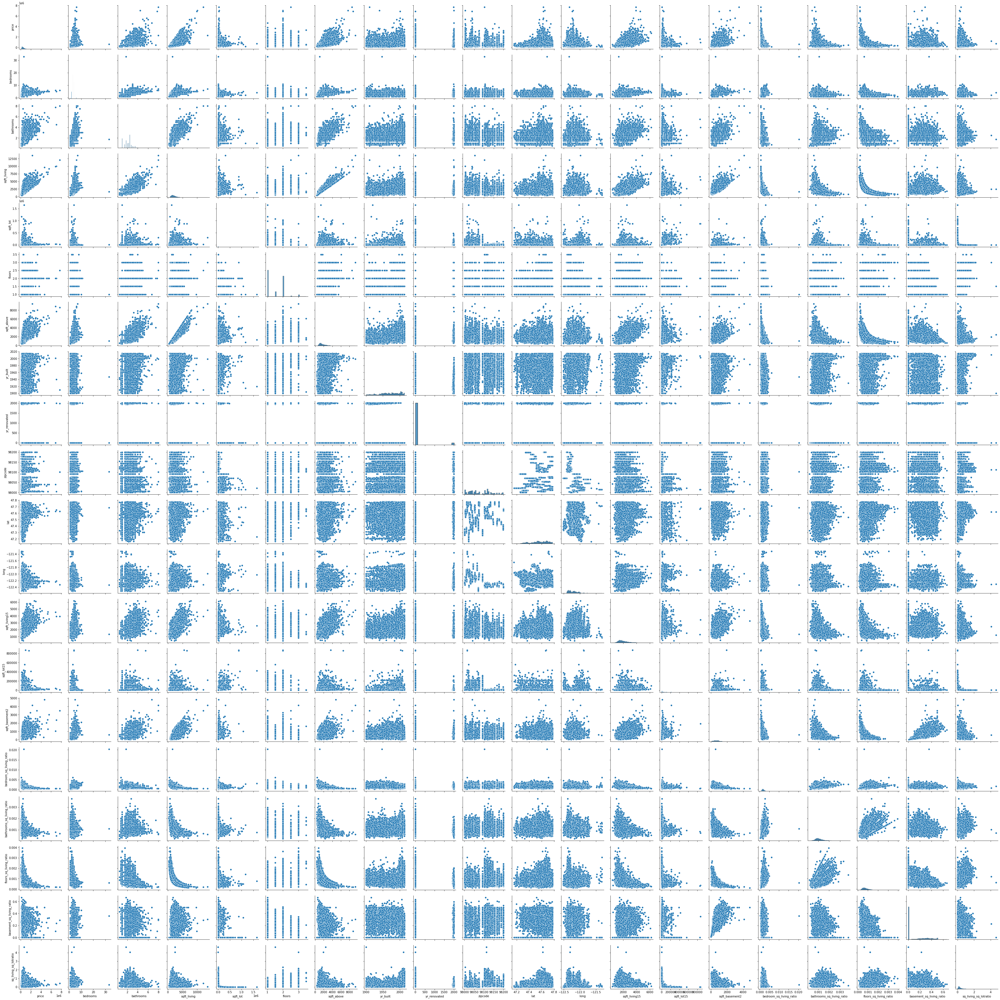

In [72]:
sns.pairplot(sq_ft_data)
plt.show()

### Making new columns for analysis

In [241]:
#bedrooms/sqfoot of living space
sq_ft_data["bedroom_sq_living_ratio"] = sq_ft_data["bedrooms"] / sq_ft_data["sqft_living"]

In [74]:
#bathrooms/sqfoot of living space 
sq_ft_data["bathrooms_sq_living_ratio"] = sq_ft_data["bathrooms"] / sq_ft_data["sqft_living"]

In [75]:
#floors/sq foor of living space
sq_ft_data["floors_sq_living_ratio"] = sq_ft_data["floors"] / sq_ft_data["sqft_living"]

In [76]:
# basement / square foot of living space
sq_ft_data["basement_sq_living_ratio"] = sq_ft_data["sqft_basement"].astype(float) / sq_ft_data["sqft_living"]

In [77]:
# House size to lot size ration
sq_ft_data["sq_living_sq_lotratio"] = sq_ft_data["sqft_living"] / sq_ft_data["sqft_lot"]

In [242]:
y= sq_ft_data["price"]
X = sq_ft_data.drop("price", axis = 1)

In [243]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y,test_size =.33, random_state=42)

In [244]:
relevent_columns = ["bedrooms", 
                    "bathrooms", 
                    "sqft_living",
                    "sqft_lot", 
                    "floors", 
                    "sqft_basement",
                    "sqft_basement2",
                   "sq_living_sq_lotratio",
                   "basement_sq_living_ratio",
                   "floors_sq_living_ratio",
                   "bathrooms_sq_living_ratio",
                   "bedroom_sq_living_ratio"]

X_train = X_train.loc[:,relevent_columns]

X_train.describe()

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,sqft_basement2,sq_living_sq_lotratio,basement_sq_living_ratio,floors_sq_living_ratio,bathrooms_sq_living_ratio,bedroom_sq_living_ratio
count,14469.000000,14469.000000,14469.000000,1.446900e+04,14469.000000,5588.000000,14469.000000,14469.000000,14469.000000,14469.000000,14469.000000
mean,3.377911,2.119998,2087.944087,1.526319e+04,1.496095,745.110773,0.324377,0.122234,0.000811,0.001077,0.001794
std,0.910328,0.770971,925.371004,4.109110e+04,0.540586,408.289975,0.271500,0.170242,0.000387,0.000316,0.000571
min,1.000000,0.500000,370.000000,5.200000e+02,1.000000,10.000000,0.000787,0.000000,0.000104,0.000293,0.000333
25%,3.000000,1.750000,1420.000000,5.082000e+03,1.000000,450.000000,0.155172,0.000000,0.000549,0.000856,0.001376
50%,3.000000,2.250000,1920.000000,7.625000e+03,1.500000,700.000000,0.246790,0.000000,0.000730,0.001029,0.001732
75%,4.000000,2.500000,2570.000000,1.076300e+04,2.000000,980.000000,0.408407,0.270115,0.000976,0.001250,0.002139
max,11.000000,8.000000,13540.000000,1.651359e+06,3.500000,4820.000000,4.653846,0.666667,0.003659,0.003767,0.005000


array([[<AxesSubplot:title={'center':'bedrooms'}>,
        <AxesSubplot:title={'center':'bathrooms'}>,
        <AxesSubplot:title={'center':'sqft_living'}>],
       [<AxesSubplot:title={'center':'sqft_lot'}>,
        <AxesSubplot:title={'center':'floors'}>,
        <AxesSubplot:title={'center':'sqft_basement2'}>],
       [<AxesSubplot:title={'center':'sq_living_sq_lotratio'}>,
        <AxesSubplot:title={'center':'basement_sq_living_ratio'}>,
        <AxesSubplot:title={'center':'floors_sq_living_ratio'}>],
       [<AxesSubplot:title={'center':'bathrooms_sq_living_ratio'}>,
        <AxesSubplot:title={'center':'bedroom_sq_living_ratio'}>,
        <AxesSubplot:>]], dtype=object)

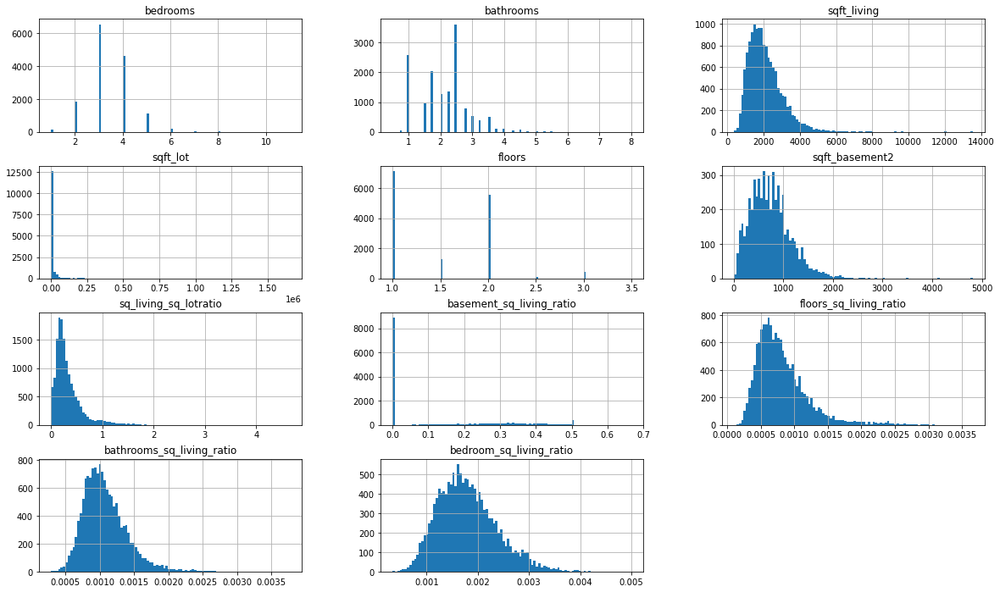

In [146]:
X_train.hist(bins=100, figsize=(20, 12))

sqft_living, sqft_lot, sqft_above, sqft_basement2 are all very skewed. will run a log transformation to normalize.

### Log transforming

In [245]:
#transforming these columns for normal distribution
sq_feet = ["sqft_living", "sqft_lot", "sqft_basement2", "sq_living_sq_lotratio"]
for feat in sq_feet:
    X_train[feat] = X_train[feat].map(lambda x: np.log(x))

In [246]:
sq_feet = ["sqft_living", "sqft_lot", "sqft_basement2", "sq_living_sq_lotratio"]
for feat in sq_feet:
    X_test[feat] = X_test[feat].map(lambda x: np.log(x))

In [247]:
y_train = y_train.map(lambda x: np.log(x))

In [248]:
y_test = y_test.map(lambda x: np.log(x))

array([[<AxesSubplot:title={'center':'bedrooms'}>,
        <AxesSubplot:title={'center':'bathrooms'}>,
        <AxesSubplot:title={'center':'sqft_living'}>],
       [<AxesSubplot:title={'center':'sqft_lot'}>,
        <AxesSubplot:title={'center':'floors'}>,
        <AxesSubplot:title={'center':'sqft_basement2'}>],
       [<AxesSubplot:title={'center':'sq_living_sq_lotratio'}>,
        <AxesSubplot:title={'center':'basement_sq_living_ratio'}>,
        <AxesSubplot:title={'center':'floors_sq_living_ratio'}>],
       [<AxesSubplot:title={'center':'bathrooms_sq_living_ratio'}>,
        <AxesSubplot:title={'center':'bedroom_sq_living_ratio'}>,
        <AxesSubplot:>]], dtype=object)

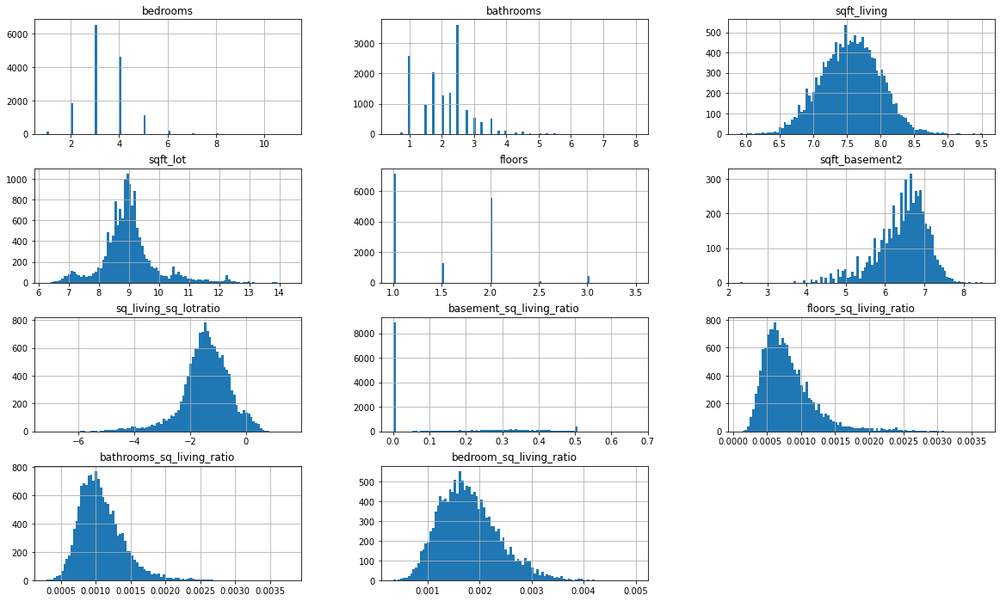

In [151]:
X_train.hist(bins=100, figsize=(20, 12))

In [249]:
train_df = pd.concat([X_train, y_train], axis = 1)
train_df["sqft_basement"] = train_df["sqft_basement"].astype(float)
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 14469 entries, 19709 to 15795
Data columns (total 13 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   bedrooms                   14469 non-null  int64  
 1   bathrooms                  14469 non-null  float64
 2   sqft_living                14469 non-null  float64
 3   sqft_lot                   14469 non-null  float64
 4   floors                     14469 non-null  float64
 5   sqft_basement              14469 non-null  float64
 6   sqft_basement2             5588 non-null   float64
 7   sq_living_sq_lotratio      14469 non-null  float64
 8   basement_sq_living_ratio   14469 non-null  float64
 9   floors_sq_living_ratio     14469 non-null  float64
 10  bathrooms_sq_living_ratio  14469 non-null  float64
 11  bedroom_sq_living_ratio    14469 non-null  float64
 12  price                      14469 non-null  float64
dtypes: float64(12), int64(1)
memory usage: 1.5

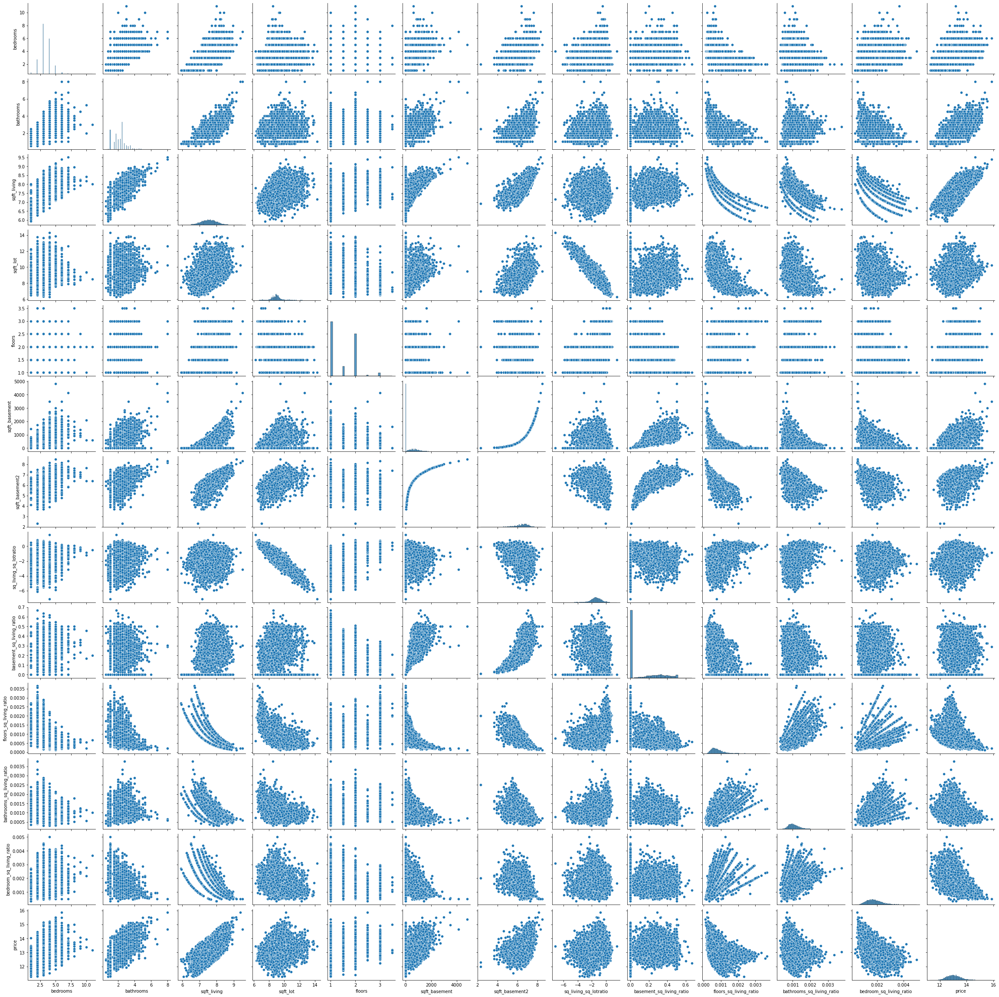

In [104]:
sns.pairplot(train_df)

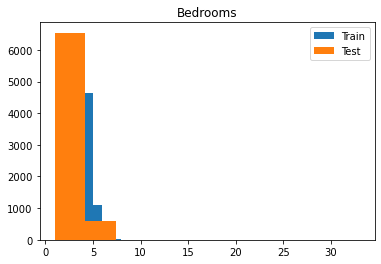

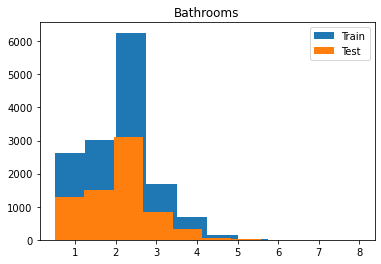

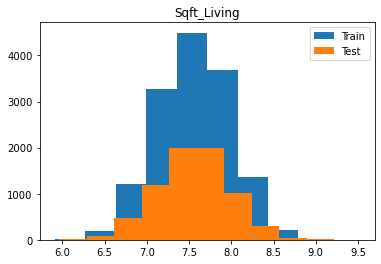

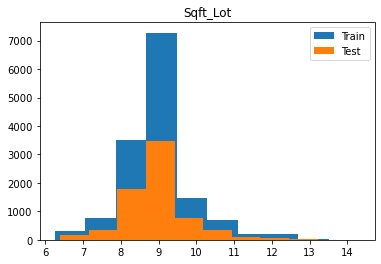

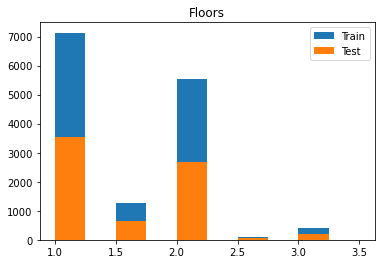

...

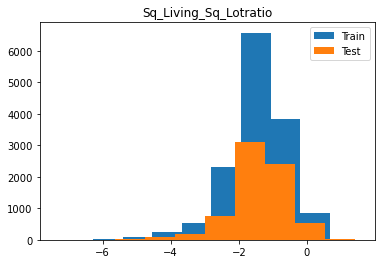

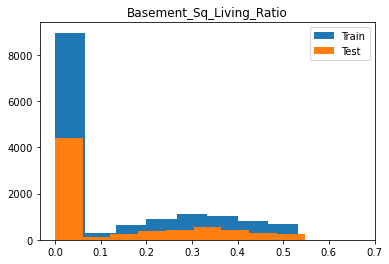

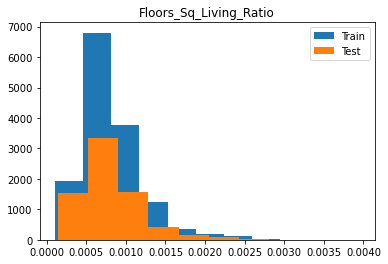

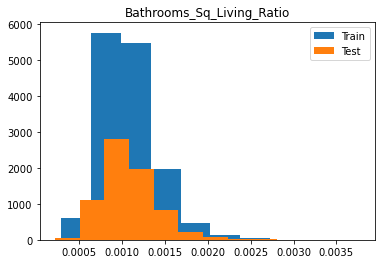

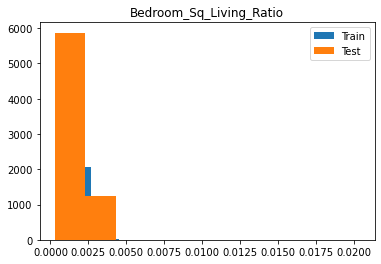

In [250]:
used_cols = [c for c in sq_ft_data.columns if c not in ["price", "date","waterfront"]]
for col in relevent_columns:
    plt.hist(X_train[col], label="Train")
    plt.hist(X_test[col], label="Test")
    plt.title(f"{col.title()}")
    plt.legend()
    plt.show()

Text(0.5, 0, 'Price')

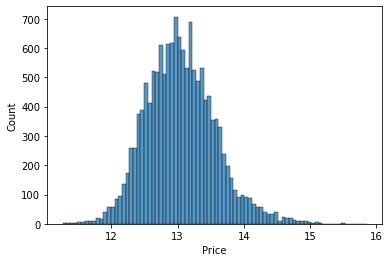

In [251]:
sns.histplot(y_train)
plt.xlabel("Price")

<AxesSubplot:>

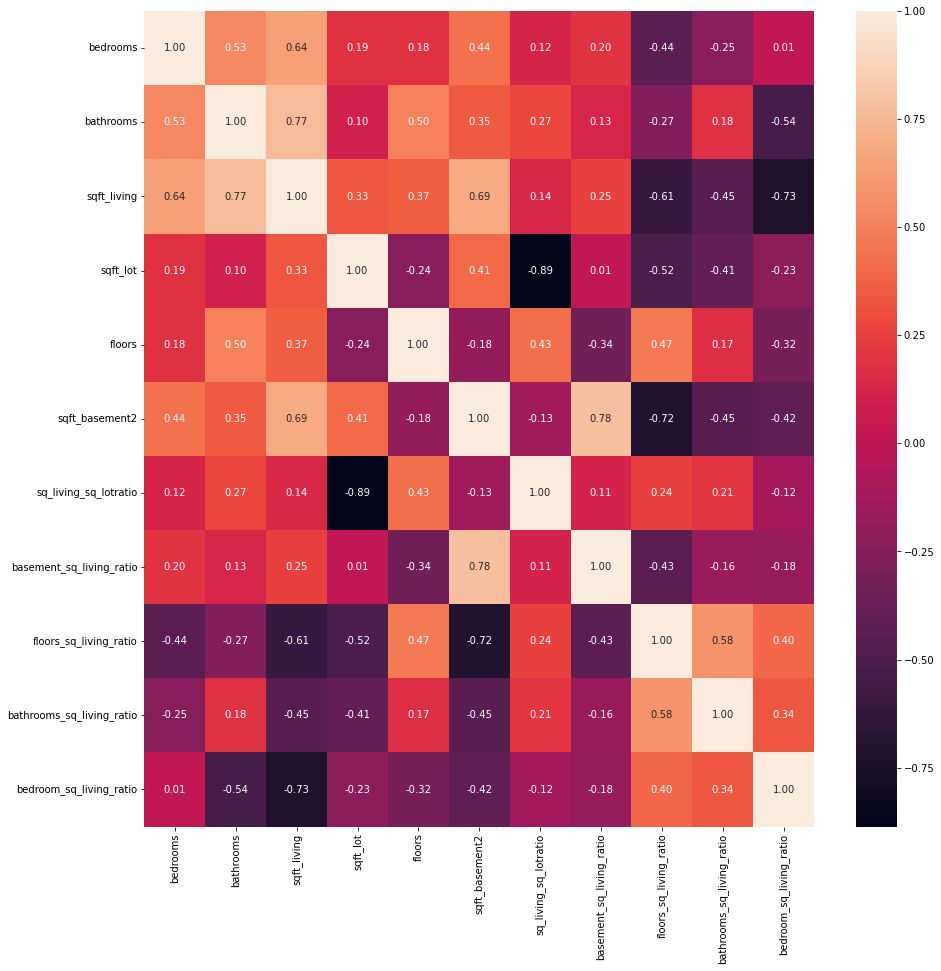

In [252]:
plt.figure(figsize=(15,15))
sns.heatmap(X_train.corr(), annot= True, fmt= ".2f")

<AxesSubplot:>

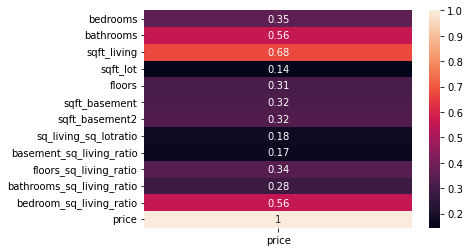

In [253]:
sns.heatmap(abs(train_df.corr())[["price"]],annot = True)

### Baseline Model

In [156]:
train_target_mean = y_train.mean()
train_target_mean

13.050449720228878

In [157]:
baseline_train_preds = [train_target_mean]*len(y_train)
baseline_test_preds = [train_target_mean] * len(y_test)

In [158]:
print(f"Train r2: {r2_score(y_train, baseline_train_preds)}")
print(f"Test r2: {r2_score(y_test, baseline_test_preds)}")
print("*****")
print(f"Train RMSE: {mean_squared_error(y_train, baseline_train_preds, squared = False)}")
print(f"Test RMSE: {mean_squared_error(y_test, baseline_test_preds, squared = False)}")

Train r2: 0.0
Test r2: -0.000167072364270604
*****
Train RMSE: 0.5273901293571133
Test RMSE: 0.5248325886236874


### First Model

In [183]:
fsm_X_train = X_train["sqft_living"]
fsm_X_test = X_test["sqft_living"]

In [186]:
fsm = sm.OLS(y_train, sm.add_constant(fsm_X_train)).fit()
fsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.456
Model:                            OLS   Adj. R-squared:                  0.456
Method:                 Least Squares   F-statistic:                 1.213e+04
Date:                Wed, 06 Oct 2021   Prob (F-statistic):               0.00
Time:                        11:22:38   Log-Likelihood:                -6868.3
No. Observations:               14469   AIC:                         1.374e+04
Df Residuals:                   14467   BIC:                         1.376e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const           6.7380      0.057    117.366      0.000       6.625       6.851
sqft_living     0.8357      0.008    110.129      0.000       0.821       0.851
==============================================================================
Omnibus:                       88.073   Durbin-Watson:                   1.980
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               84.265
Skew:                           0.161   Prob(JB):                     5.04e-19
Kurtosis:                       2.811   Cond. No.                         137.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [188]:
fsm_train_preds = fsm.predict(sm.add_constant(fsm_X_train))
fsm_test_preds = fsm.predict(sm.add_constant(fsm_X_test))

Train r2: 0.4560
Test r2: 0.4539
*****
Train RMSE: $0.39
Test RMSE: $0.39
*****
Train MAE: $0.31
Test MAE: $0.32


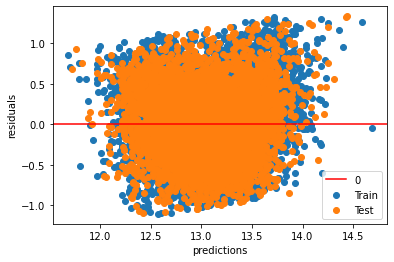

In [189]:
evaluate(y_train, fsm_train_preds, y_test, fsm_test_preds)

In [218]:
sq_living_lot_X_train =X_train[["sqft_living", "sqft_lot"]]
sq_living_lot_X_test =X_test[["sqft_living", "sqft_lot"]]

In [219]:
sq_living_lot = sm.OLS(y_train, sm.add_constant(sq_living_lot_X_train)).fit()
sq_living_lot.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.463
Model:                            OLS   Adj. R-squared:                  0.463
Method:                 Least Squares   F-statistic:                     6239.
Date:                Wed, 06 Oct 2021   Prob (F-statistic):               0.00
Time:                        11:43:02   Log-Likelihood:                -6773.4
No. Observations:               14469   AIC:                         1.355e+04
Df Residuals:                   14466   BIC:                         1.358e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const           6.9267      0.059    118.103      0.000       6.812       7.042
sqft_living     0.8722      0.008    109.183      0.000       0.857       0.888
sqft_lot       -0.0516      0.004    -13.817      0.000      -0.059      -0.044
==============================================================================
Omnibus:                       73.052   Durbin-Watson:                   1.979
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               72.522
Skew:                           0.161   Prob(JB):                     1.79e-16
Kurtosis:                       2.871   Cond. No.                         217.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [224]:
sq_living_lot_X_train_preds = sq_living_lot.predict(sm.add_constant(sq_living_lot_X_train))
sq_living_lot_X_test_preds = sq_living_lot.predict(sm.add_constant(sq_living_lot_X_test))

Train r2: 0.4631
Test r2: 0.4621
*****
Train RMSE: $0.39
Test RMSE: $0.38
*****
Train MAE: $0.31
Test MAE: $0.31


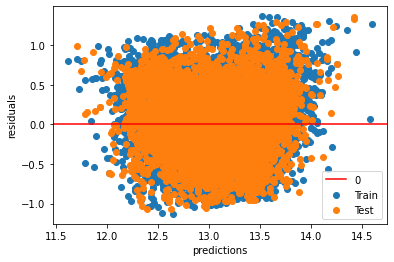

In [225]:
evaluate(y_train, sq_living_lot_X_train_preds, y_test, sq_living_lot_X_test_preds)

In [222]:
living_lot_X_train =X_train[["sqft_living", "sqft_lot","sq_living_sq_lotratio" ]]
living_lot_X_test =X_test[["sqft_living", "sqft_lot","sq_living_sq_lotratio"]]
living_lot = sm.OLS(y_train, sm.add_constant(living_lot_X_train)).fit()
living_lot.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.463
Model:                            OLS   Adj. R-squared:                  0.463
Method:                 Least Squares   F-statistic:                     6239.
Date:                Wed, 06 Oct 2021   Prob (F-statistic):               0.00
Time:                        12:09:10   Log-Likelihood:                -6773.4
No. Observations:               14469   AIC:                         1.355e+04
Df Residuals:                   14466   BIC:                         1.358e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                     6.9267      0.059    118.103      0.000       6.812       7.042
sqft_living               0.5643      0.005    111.681      0.000       0.554       0.574
sqft_lot                  0.2563      0.003     85.872      0.000       0.250       0.262
sq_living_sq_lotratio     0.3079      0.003     93.551      0.000       0.301       0.314
==============================================================================
Omnibus:                       73.052   Durbin-Watson:                   1.979
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               72.522
Skew:                           0.161   Prob(JB):                     1.79e-16
Kurtosis:                       2.871   Cond. No.                     5.44e+15
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 6.94e-26. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

Train r2: 0.4631
Test r2: 0.4621
*****
Train RMSE: $0.39
Test RMSE: $0.38
*****
Train MAE: $0.31
Test MAE: $0.31


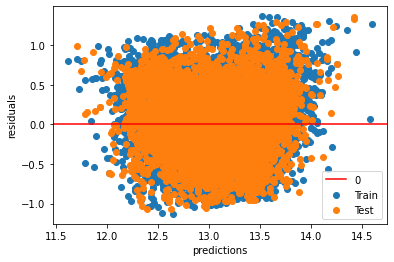

In [226]:
living_lot_X_train_preds = living_lot.predict(sm.add_constant(living_lot_X_train))
living_lot_X_test_preds = living_lot.predict(sm.add_constant(living_lot_X_test))
evaluate(y_train, living_lot_X_train_preds, y_test, living_lot_X_test_preds)

In [254]:
living_lot_bedroom_X_train =X_train[["sqft_living", "sqft_lot", "bedroom_sq_living_ratio"]]
living_lot_bedroom_X_test =X_test[["sqft_living", "sqft_lot", "bedroom_sq_living_ratio"]]
living_lot_bedroom = sm.OLS(y_train, sm.add_constant(living_lot_bedroom_X_train)).fit()
living_lot_bedroom.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.471
Model:                            OLS   Adj. R-squared:                  0.471
Method:                 Least Squares   F-statistic:                     4294.
Date:                Wed, 06 Oct 2021   Prob (F-statistic):               0.00
Time:                        12:59:03   Log-Likelihood:                -6665.4
No. Observations:               14469   AIC:                         1.334e+04
Df Residuals:                   14465   BIC:                         1.337e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
===========================================================================================
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                       8.0394      0.095     84.379      0.000       7.853       8.226
sqft_living                 0.7522      0.011     66.199      0.000       0.730       0.774
sqft_lot                   -0.0503      0.004    -13.561      0.000      -0.058      -0.043
bedroom_sq_living_ratio  -121.3334      8.225    -14.752      0.000    -137.456    -105.211
==============================================================================
Omnibus:                       74.804   Durbin-Watson:                   1.977
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               75.264
Skew:                           0.170   Prob(JB):                     4.54e-17
Kurtosis:                       2.903   Cond. No.                     3.05e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.05e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Train r2: 0.4711
Test r2: 0.4656
*****
Train RMSE: $0.38
Test RMSE: $0.38
*****
Train MAE: $0.31
Test MAE: $0.31


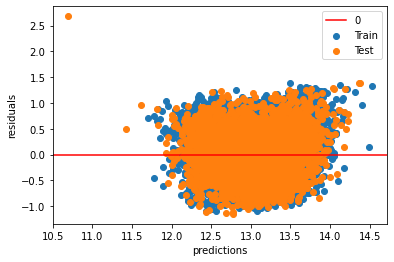

In [255]:
living_lot_bedroom_X_train_preds = living_lot_bedroom.predict(sm.add_constant(living_lot_bedroom_X_train))
living_lot_bedroom_X_test_preds = living_lot_bedroom.predict(sm.add_constant(living_lot_bedroom_X_test))
evaluate(y_train, living_lot_bedroom_X_train_preds, y_test, living_lot_bedroom_X_test_preds)


In [234]:
living_lot_bathroom_X_train =X_train[["sqft_living", "sqft_lot","bathrooms_sq_living_ratio",]]
living_lot_bathroom_X_test =X_test[["sqft_living", "sqft_lot", "bathrooms_sq_living_ratio",]]

living_lot_bathroom = sm.OLS(y_train, sm.add_constant(living_lot_bathroom_X_train)).fit()
living_lot_bathroom.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.463
Model:                            OLS   Adj. R-squared:                  0.463
Method:                 Least Squares   F-statistic:                     4159.
Date:                Wed, 06 Oct 2021   Prob (F-statistic):               0.00
Time:                        12:51:38   Log-Likelihood:                -6773.4
No. Observations:               14469   AIC:                         1.355e+04
Df Residuals:                   14465   BIC:                         1.359e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
=============================================================================================
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
const                         6.9288      0.075     92.197      0.000       6.781       7.076
sqft_living                   0.8721      0.009    101.809      0.000       0.855       0.889
sqft_lot                     -0.0517      0.004    -13.167      0.000      -0.059      -0.044
bathrooms_sq_living_ratio    -0.5197     11.921     -0.044      0.965     -23.886      22.846
==============================================================================
Omnibus:                       72.965   Durbin-Watson:                   1.979
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               72.435
Skew:                           0.161   Prob(JB):                     1.87e-16
Kurtosis:                       2.871   Cond. No.                     4.38e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 4.38e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Train r2: 0.4631
Test r2: 0.4621
*****
Train RMSE: $0.39
Test RMSE: $0.38
*****
Train MAE: $0.31
Test MAE: $0.31


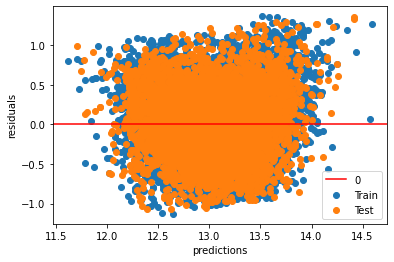

In [235]:

living_lot_bathroom_X_train_preds = living_lot_bathroom.predict(sm.add_constant(living_lot_bathroom_X_train))
living_lot_bathroom_X_test_preds = living_lot_bathroom.predict(sm.add_constant(living_lot_bathroom_X_test))

evaluate(y_train, living_lot_bathroom_X_train_preds, y_test, living_lot_bathroom_X_test_preds)

In [236]:
living_lot_floor_X_train =X_train[["sqft_living", "sqft_lot", "floors_sq_living_ratio"]]
living_lot_floor_X_test =X_test[["sqft_living", "sqft_lot", "floors_sq_living_ratio"]]
living_lot_floor = sm.OLS(y_train, sm.add_constant(living_lot_floor_X_train)).fit()
living_lot_floor.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.467
Model:                            OLS   Adj. R-squared:                  0.467
Method:                 Least Squares   F-statistic:                     4231.
Date:                Wed, 06 Oct 2021   Prob (F-statistic):               0.00
Time:                        12:53:12   Log-Likelihood:                -6716.2
No. Observations:               14469   AIC:                         1.344e+04
Df Residuals:                   14465   BIC:                         1.347e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      6.2449      0.086     72.304      0.000       6.076       6.414
sqft_living                0.9271      0.009     97.962      0.000       0.909       0.946
sqft_lot                  -0.0331      0.004     -8.051      0.000      -0.041      -0.025
floors_sq_living_ratio   123.1778     11.492     10.719      0.000     100.652     145.703
==============================================================================
Omnibus:                       90.088   Durbin-Watson:                   1.976
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               89.806
Skew:                           0.181   Prob(JB):                     3.15e-20
Kurtosis:                       2.865   Cond. No.                     4.24e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 4.24e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Train r2: 0.4674
Test r2: 0.4656
*****
Train RMSE: $0.38
Test RMSE: $0.38
*****
Train MAE: $0.31
Test MAE: $0.31


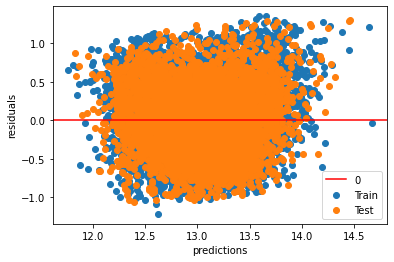

In [237]:

living_lot_floor_X_train_preds = living_lot_floor.predict(sm.add_constant(living_lot_floor_X_train))
living_lot_floor_X_test_preds = living_lot_floor.predict(sm.add_constant(living_lot_floor_X_test))

evaluate(y_train, living_lot_floor_X_train_preds, y_test, living_lot_floor_X_test_preds)

In [238]:
living_bedroom_X_train =X_train[["sqft_living","bedroom_sq_living_ratio"]]
living_bedroom_X_test =X_test[["sqft_living","bedroom_sq_living_ratio"]]
living_bedroom = sm.OLS(y_train, sm.add_constant(living_bedroom_X_train)).fit()
living_bedroom.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.464
Model:                            OLS   Adj. R-squared:                  0.464
Method:                 Least Squares   F-statistic:                     6270.
Date:                Wed, 06 Oct 2021   Prob (F-statistic):               0.00
Time:                        12:56:12   Log-Likelihood:                -6756.8
No. Observations:               14469   AIC:                         1.352e+04
Df Residuals:                   14466   BIC:                         1.354e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
===========================================================================================
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                       7.8802      0.095     82.821      0.000       7.694       8.067
sqft_living                 0.7139      0.011     64.456      0.000       0.692       0.736
bedroom_sq_living_ratio  -124.0195      8.274    -14.988      0.000    -140.239    -107.800
==============================================================================
Omnibus:                       84.803   Durbin-Watson:                   1.977
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               83.470
Skew:                           0.170   Prob(JB):                     7.49e-19
Kurtosis:                       2.847   Cond. No.                     1.97e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.97e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Train r2: 0.4644
Test r2: 0.4580
*****
Train RMSE: $0.39
Test RMSE: $0.39
*****
Train MAE: $0.31
Test MAE: $0.31


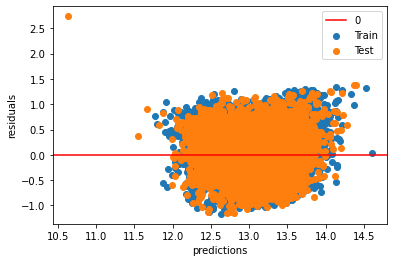

In [239]:
living_bedroom_X_train_preds = living_bedroom.predict(sm.add_constant(living_bedroom_X_train))
living_bedroom_X_test_preds = living_bedroom.predict(sm.add_constant(living_bedroom_X_test))
evaluate(y_train, living_bedroom_X_train_preds, y_test, living_bedroom_X_test_preds)


In [256]:
living_bathrooms_X_train =X_train[["sqft_living","bathrooms_sq_living_ratio"]]
living_bathrooms_X_test =X_test[["sqft_living","bathrooms_sq_living_ratio"]]
living_bathrooms = sm.OLS(y_train, sm.add_constant(living_bathrooms_X_train)).fit()
living_bathrooms.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.457
Model:                            OLS   Adj. R-squared:                  0.457
Method:                 Least Squares   F-statistic:                     6080.
Date:                Wed, 06 Oct 2021   Prob (F-statistic):               0.00
Time:                        13:05:36   Log-Likelihood:                -6859.6
No. Observations:               14469   AIC:                         1.373e+04
Df Residuals:                   14466   BIC:                         1.375e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
=============================================================================================
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
const                         6.5682      0.070     93.298      0.000       6.430       6.706
sqft_living                   0.8514      0.008    100.511      0.000       0.835       0.868
bathrooms_sq_living_ratio    47.5121     11.416      4.162      0.000      25.135      69.889
==============================================================================
Omnibus:                       95.049   Durbin-Watson:                   1.978
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               91.531
Skew:                           0.171   Prob(JB):                     1.33e-20
Kurtosis:                       2.812   Cond. No.                     2.70e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.7e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Train r2: 0.4567
Test r2: 0.4540
*****
Train RMSE: $0.39
Test RMSE: $0.39
*****
Train MAE: $0.31
Test MAE: $0.32


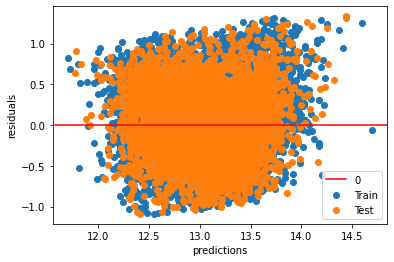

In [257]:
living_bathrooms_X_train_preds = living_bathrooms.predict(sm.add_constant(living_bathrooms_X_train))
living_bathrooms_X_test_preds = living_bathrooms.predict(sm.add_constant(living_bathrooms_X_test))
evaluate(y_train, living_bathrooms_X_train_preds, y_test, living_bathrooms_X_test_preds)

In [259]:
living_floors_X_train =X_train[["sqft_living","floors_sq_living_ratio"]]
living_floors_X_test =X_test[["sqft_living","floors_sq_living_ratio"]]
living_floors = sm.OLS(y_train, sm.add_constant(living_floors_X_train)).fit()
living_floors.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.465
Model:                            OLS   Adj. R-squared:                  0.465
Method:                 Least Squares   F-statistic:                     6286.
Date:                Wed, 06 Oct 2021   Prob (F-statistic):               0.00
Time:                        13:07:45   Log-Likelihood:                -6748.5
No. Observations:               14469   AIC:                         1.350e+04
Df Residuals:                   14466   BIC:                         1.353e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      5.9294      0.077     76.868      0.000       5.778       6.081
sqft_living                0.9253      0.009     97.584      0.000       0.907       0.944
floors_sq_living_ratio   162.2293     10.441     15.538      0.000     141.764     182.695
==============================================================================
Omnibus:                      102.376   Durbin-Watson:                   1.976
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              100.902
Skew:                           0.187   Prob(JB):                     1.23e-22
Kurtosis:                       2.836   Cond. No.                     2.48e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.48e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Train r2: 0.4650
Test r2: 0.4622
*****
Train RMSE: $0.39
Test RMSE: $0.38
*****
Train MAE: $0.31
Test MAE: $0.31


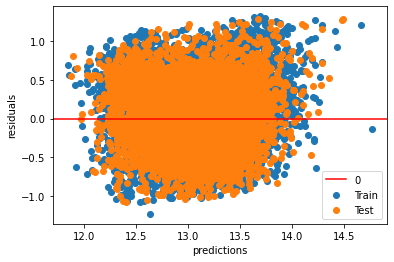

In [262]:
living_floors_X_train_preds = living_floors.predict(sm.add_constant(living_floors_X_train))
living_floors_X_test_preds = living_floors.predict(sm.add_constant(living_floors_X_test))
evaluate(y_train, living_floors_X_train_preds, y_test, living_floors_X_test_preds)

In [266]:
all_cols_X_train =X_train[["sqft_living","floors_sq_living_ratio",
                                "bathrooms_sq_living_ratio",
                                "bedroom_sq_living_ratio",
                                "sq_living_sq_lotratio"
]]
all_cols_X_test =X_test[["sqft_living","floors_sq_living_ratio",
                                "bathrooms_sq_living_ratio",
                                "bedroom_sq_living_ratio",
                                "sq_living_sq_lotratio"]]
all_cols = sm.OLS(y_train, sm.add_constant(all_cols_X_train)).fit()
all_cols.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.475
Model:                            OLS   Adj. R-squared:                  0.475
Method:                 Least Squares   F-statistic:                     2614.
Date:                Wed, 06 Oct 2021   Prob (F-statistic):               0.00
Time:                        13:16:01   Log-Likelihood:                -6615.0
No. Observations:               14469   AIC:                         1.324e+04
Df Residuals:                   14463   BIC:                         1.329e+04
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
=============================================================================================
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
const                         7.4367      0.120     62.116      0.000       7.202       7.671
sqft_living                   0.7693      0.013     57.358      0.000       0.743       0.796
floors_sq_living_ratio      123.3190     12.277     10.045      0.000      99.254     147.384
bathrooms_sq_living_ratio   -40.5336     12.643     -3.206      0.001     -65.315     -15.752
bedroom_sq_living_ratio    -112.6392      8.248    -13.656      0.000    -128.806     -96.472
sq_living_sq_lotratio         0.0359      0.004      8.704      0.000       0.028       0.044
==============================================================================
Omnibus:                       84.102   Durbin-Watson:                   1.975
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               84.702
Skew:                           0.180   Prob(JB):                     4.05e-19
Kurtosis:                       2.897   Cond. No.                     3.56e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.56e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Train r2: 0.4747
Test r2: 0.4694
*****
Train RMSE: $0.38
Test RMSE: $0.38
*****
Train MAE: $0.31
Test MAE: $0.31


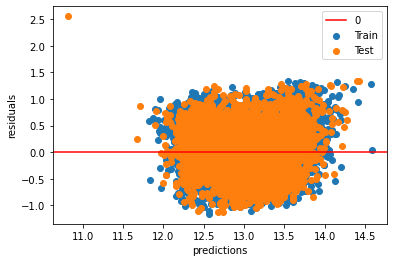

In [269]:
all_cols_X_train_preds = all_cols.predict(sm.add_constant(all_cols_X_train))
all_cols_X_test_preds = all_cols.predict(sm.add_constant(all_cols_X_test))
evaluate(y_train, all_cols_X_train_preds, y_test, all_cols_X_test_preds)